In [1]:
cd ..

/home/mars/src_aiai


In [2]:
from src.util import gpu_setup
gpu_setup()

8 actual GPUs, 1 in use.


2022-03-25 11:43:13.452405: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-03-25 11:43:14.111318: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14587 MB memory:  -> device: 2, name: Tesla V100-PCIE-16GB, pci bus id: 0000:1d:00.0, compute capability: 7.0


In [3]:
import numpy as np
import matplotlib.pyplot as plt

In [4]:
import tensorflow as tf

In [5]:
from src.data import load_M51
from src.networks.UNet import UNet
from src.operators.NUFFT2D_TF import NUFFT2D_TF
from src.operators.NUFFT2D import NUFFT2D

from src.sampling.uv_sampling import spider_sampling, random_sampling

from optimusprimal import linear_operators 

In [6]:
from src.visualisation import compare

In [7]:
mse = lambda x,y: np.mean(np.square(x-y))

In [9]:
x = load_M51()
# x = np.load("./data/intermediate/COCO/NUFFT_Random/x_true_test_30dB.npy")[46]
x /= x.max()

In [10]:
Nd = (256,256)
Kd = (512,512)
Jd = (6,6)

In [13]:
uv = random_sampling(Nd[0]**2//2) 
# uv = spider_sampling()
w2 = np.linalg.norm(uv, axis=1)
w2 = w2/w2.max()

grid_cell = 2*np.pi /512 
binned = (uv[:,:]+np.pi+.5*grid_cell) // grid_cell
binned = [tuple(x) for x in binned]
cells = set(binned)
w_gridded = np.zeros(uv.shape[0])
for cell in list(cells):
    mask = np.all(np.array(cell) ==  binned, axis=1)
    w_gridded[mask] = np.sum(mask)

# w = 
w = 1/w_gridded
w /= w.max()

m_op = NUFFT2D_TF()
m_op.plan(uv, Nd, Kd, Jd, 1)

100%|██████████| 32768/32768 [00:04<00:00, 6706.96it/s]


some values lie out of the interpolation array, these are not used, check baselines


In [85]:
class w_op(NUFFT2D_TF):
    def adj_op(self, x):
        return super().adj_op(x*w)
    
    def dir_op(self, x):
        return super().dir_op(x)

In [86]:
b = w_op()
b.plan(uv, Nd, Kd, Jd, 1)

100%|██████████| 4440/4440 [00:01<00:00, 3676.50it/s]


In [87]:
x_init = np.random.uniform(size=(256,256))
nu, sol = linear_operators.power_method(b, x_init, tol=1e-3, iters=1000)
 

2022-03-24 16:55:23,098 - Optimus Primal - INFO - Starting Power method
2022-03-24 16:55:23,165 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2022-03-24 16:55:23,484 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2022-03-24 16:55:23,805 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2022-03-24 16:55:24,124 - Optimus Primal - INFO - [Power Method] iter = 31, tol = 0.0
2022-03-24 16:55:24,375 - Optimus Primal - INFO - [Power Method] Converged with norm= 0.6363382, iter = 39, tol = 0.00092902035


In [14]:
from skimage.metrics import structural_similarity, peak_signal_noise_ratio

In [55]:
[array([[[[1.9007841]]]], dtype=float32), array([0.09773241], dtype=float32)]


0.0677490234375

In [125]:
1/(m_op.n_measurements / Kd[0]**2)

59.04144144144144

In [127]:
np.mean(w)

0.6734234234234234

(9.6823294481594, 0.20402738513672455)

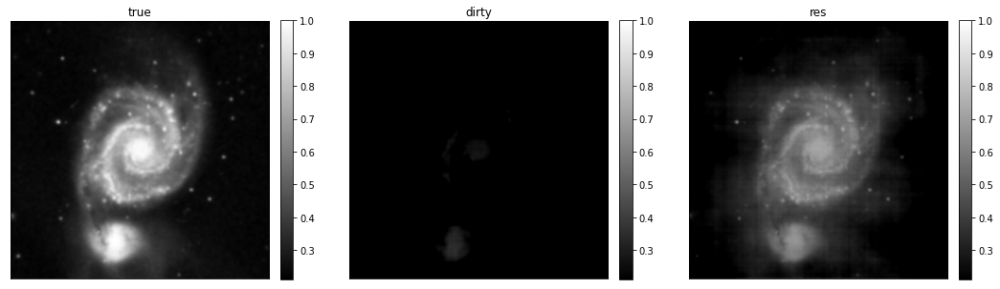

In [15]:
y = m_op.dir_op(x[np.newaxis,:])
x_dirty = tf.math.real(m_op.adj_op(y * w) )[0].numpy().real # * np.linalg.norm(w) #* (m_op.n_measurements / Kd[0]**2)
# x_dirty = (x_dirty - x_dirty.min())/(x_dirty.max() - x_dirty.min())
compare([x, x_dirty, abs(x - x_dirty) ], cmap='gray', titles=['true', 'dirty', "res"], colorbar=True, same_scale=True)

peak_signal_noise_ratio(x, x_dirty), structural_similarity(x, x_dirty)

(-18.99525811105027, 0.0016338419496924792)

# Load trained denoiser

In [18]:
ISNR = 15 # 10dB and 30dB are also saved so any of those values can be used

In [16]:
denoiser = UNet(
    Nd, 
    uv=None,
    op=None, 
    depth=4, 
    input_type="image", 
    measurement_weights=1,
    batch_size=1
    )

KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256), dtype=tf.float32, name='input_2'), name='input_2', description="created by layer 'input_2'") KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256), dtype=tf.float32, name=None), name='tf.__operators__.add_1/AddV2:0', description="created by layer 'tf.__operators__.add_1'")


In [17]:
latest = tf.train.latest_checkpoint(f"./models/COCO/Identity/UNet_{ISNR}dB")
denoiser.load_weights(latest)


# Looking at denoising power of denoiser

In [19]:
ISNR

15

In [20]:
sigma = np.sqrt(np.mean(np.abs(x)**2)) * 10**(-ISNR/20)
n = np.random.normal( 0, sigma, x.shape) #+ 1j * np.random.normal( 0, sigma, x[0].shape)

In [20]:
x_noisy = x + n

In [21]:
x_noisy = (x_noisy - x_noisy.min())/(x_noisy.max() - x_noisy.min())

In [22]:
x_denoised = denoiser(x_noisy[np.newaxis, :])

2022-03-17 14:16:32.284364: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8101


In [23]:
x_denoised = x_denoised *(x_noisy.max() - x_noisy.min()) + x_noisy.min()

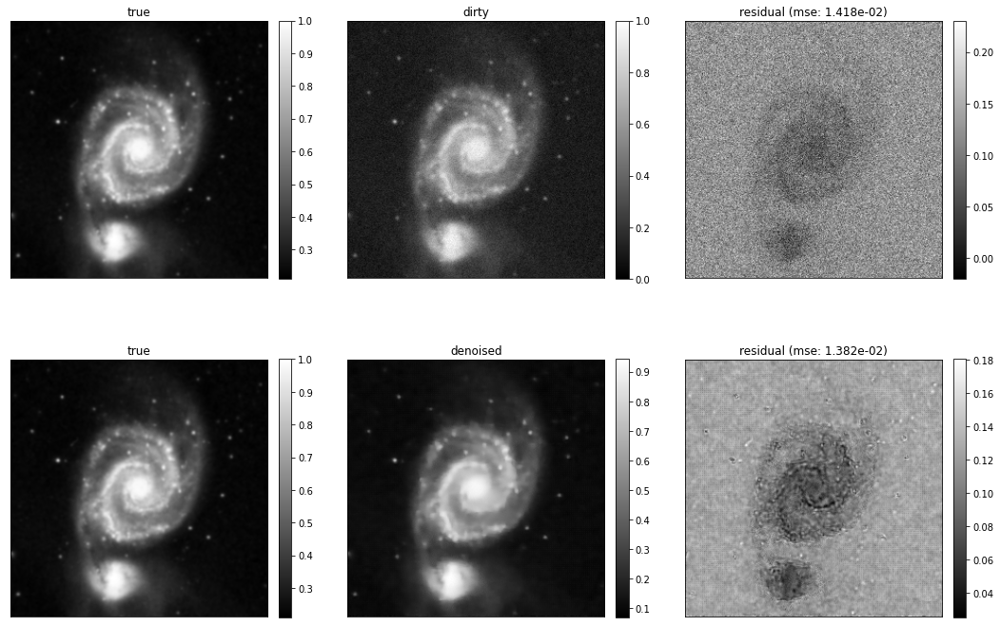

In [24]:
compare([x, x_noisy.real, x-x_noisy.real, x, x_denoised[0], x -x_denoised[0]], nrows=2, ncols=3, same_scale=False, cmap='gray', colorbar=True, titles=["true", "dirty", f"residual (mse: {mse(x, x_noisy):.3e})", "true", "denoised", f"residual (mse: {mse(x, x_denoised):.3e})"])

# Looking at denoising power of denoiser on pseudo-inverse images

In [25]:
from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()
x_dirty2 = m_op.adj_op((y.reshape(1,-1)).astype(np.complex64))

In [26]:
c = x_dirty
# rescale to be within (0,1)
c = (c - c.min()) / (c.max()-c.min())

In [27]:
x_denoised2 = denoiser(c[np.newaxis,:])

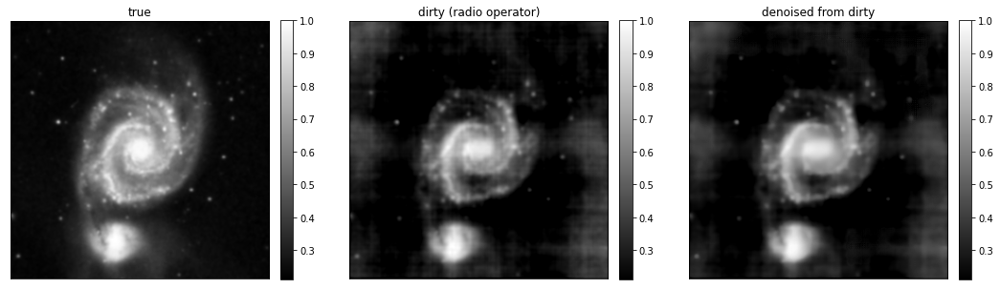

In [28]:
compare([x, c, x_denoised2.numpy().real[0]], nrows=1, ncols=3, same_scale=True, cmap='gray', colorbar=True, titles=["true", "dirty (radio operator)", "denoised from dirty"])

# Gradient descent

In [21]:
class Gradient(tf.keras.layers.Layer):
    """
    Gradient operator
    TODO create docstring
    """
    def __init__(self, m_op, shape_x, shape_y, depth):
        self.m_op = m_op
        self.input_spec = [
            tf.keras.layers.InputSpec(
                dtype=tf.float32,
                shape=shape_x
            ),
            tf.keras.layers.InputSpec(
                dtype=tf.complex64,
                shape=shape_y
            )
        ]
        self.depth = depth +1
        self.trainable=False
    

    def __call__(self, x, y, measurement_weights=1):
        x = tf.cast(x, tf.complex64)
        m = self.m_op.dir_op(x) 
        res = m - y
        grad = self.m_op.adj_op( res  * measurement_weights)
        grad = tf.cast(grad, tf.float32)
        return grad

In [35]:
grad = Gradient(m_op, Nd, (m_op.n_measurements,), 0)

In [36]:
measurement_n = np.random.normal( 0, sigma, (100,y.shape[1])) + 1j * np.random.normal( 0, sigma, (100,y.shape[1]))
measurement_n2 = np.array([m_op.adj_op(measurement_n[i][np.newaxis,:]) for i in range(100)]).real


In [22]:
ISNR = 15# use 30dB for measurement noise
s = lambda x: np.sqrt(np.mean(np.abs(y)**2)) * 10**(-x/20)
sigma = np.sqrt(np.mean(np.abs(y)**2)) * 10**(-ISNR/20)
n = np.random.normal( 0, sigma, y.shape) + 1j * np.random.normal( 0, sigma, y.shape)
y_dirty = y + n

In [24]:
sigma

0.05036258923577032

In [26]:
x

array([[0.21393849, 0.21758388, 0.2208299 , ..., 0.21850912, 0.21996687,
        0.22113746],
       [0.21575108, 0.22013496, 0.22397234, ..., 0.22149171, 0.2206239 ,
        0.22009574],
       [0.21969667, 0.22338726, 0.22639307, ..., 0.22470091, 0.22280075,
        0.22177829],
       ...,
       [0.23809756, 0.23560895, 0.23119727, ..., 0.22885172, 0.22508638,
        0.22291581],
       [0.23447165, 0.23158935, 0.22896   , ..., 0.22590072, 0.22325268,
        0.22197834],
       [0.22832985, 0.22544529, 0.22489884, ..., 0.22417477, 0.2222723 ,
        0.22170399]], dtype=float32)

In [25]:
np.linalg.norm(y)

51.266422

In [23]:
x_dirty = m_op.adj_op(y_dirty).numpy().real
compare([x, x_dirty[0], denoiser(x_dirty)[0]], cmap='gray')

NameError: name 'denoiser' is not defined

In [49]:
im_n = np.random.normal( 0, sigma*0.35, (100,256,256)) 

In [50]:
sigma

0.03284555971622467

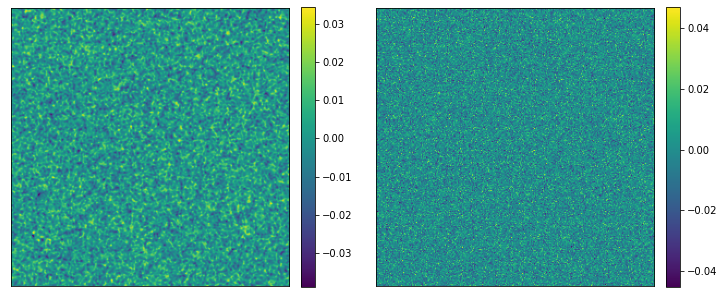

In [51]:
compare([measurement_n2[0][0], im_n[0]], colorbar="True")

In [52]:
import seaborn as sns

/anaconda/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/anaconda/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

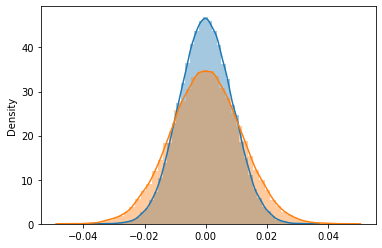

In [53]:
sns.distplot(measurement_n2[0][0].flatten())
sns.distplot( im_n[0].flatten())

In [54]:
(np.linalg.norm(measurement_n2)/np.linalg.norm(im_n))

0.7435219288628419

In [55]:
s(24)/s(15)

0.3548133892335754

In [56]:
ns = np.array([s(i) for i in np.linspace(30, 5,100)])

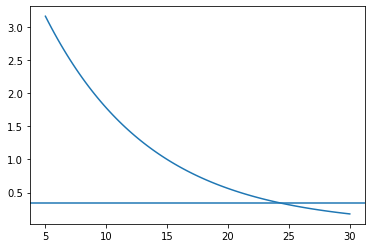

In [57]:
plt.plot(np.linspace(30, 5,100), ns/s(15))
plt.axhline(0.35)

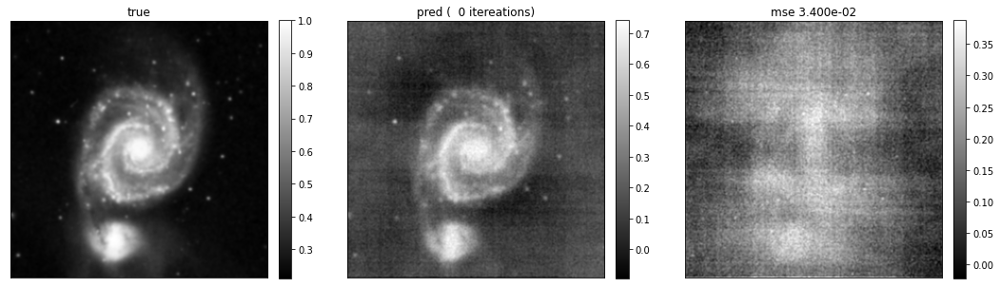

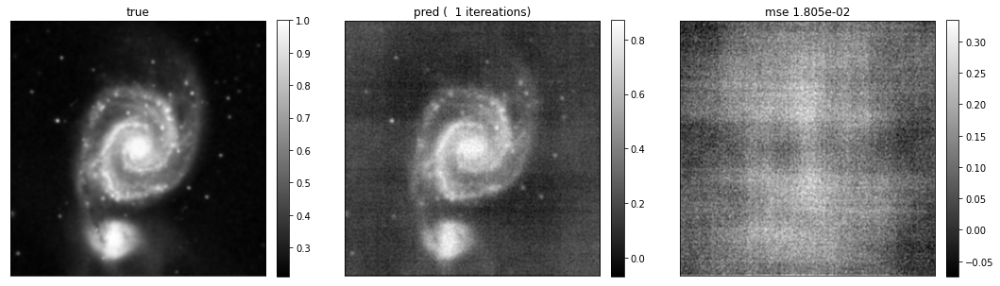

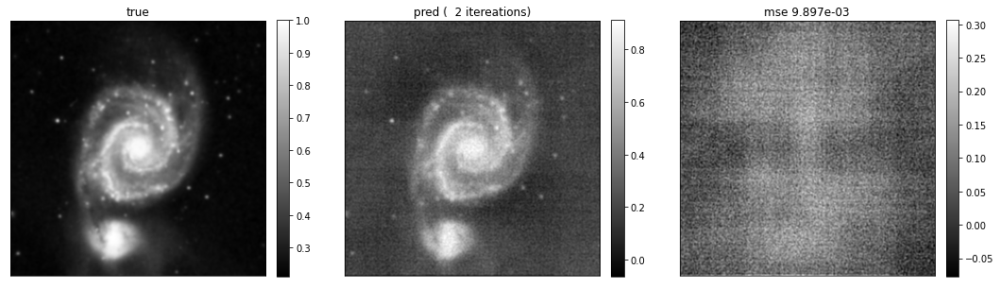

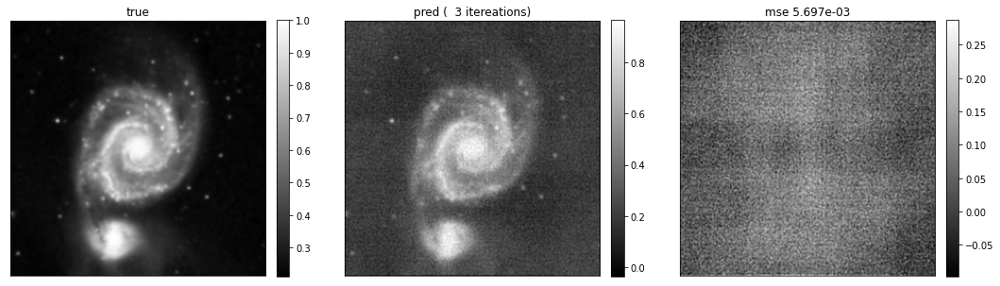

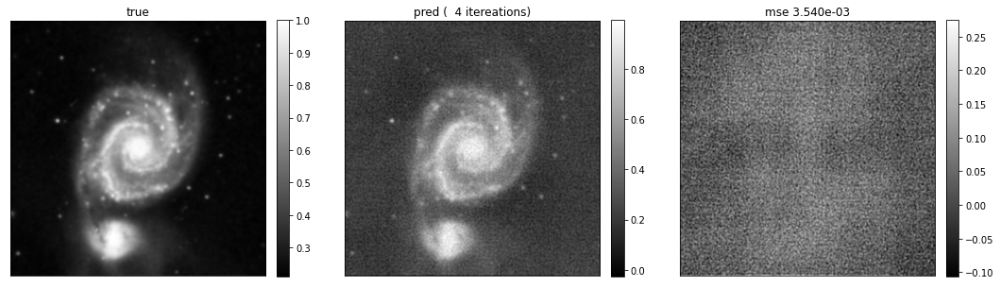

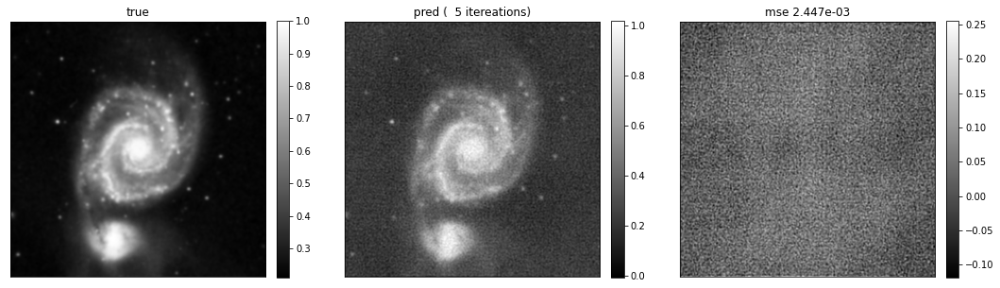

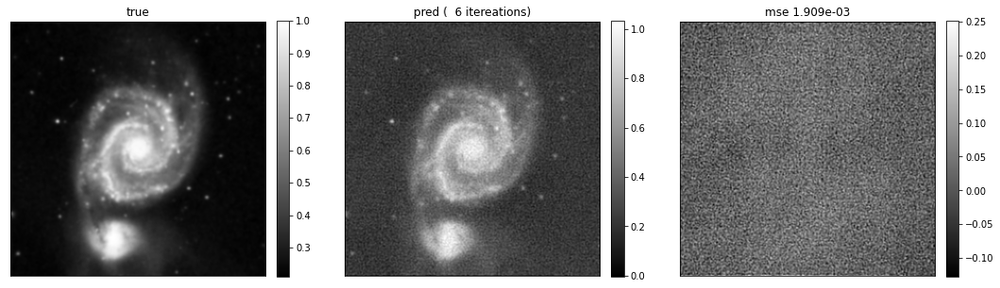

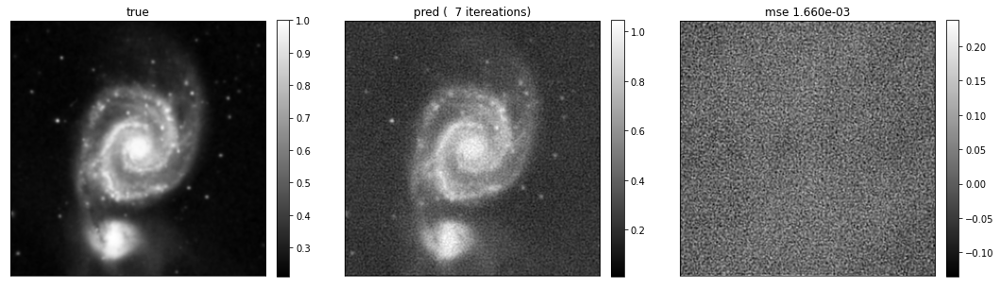

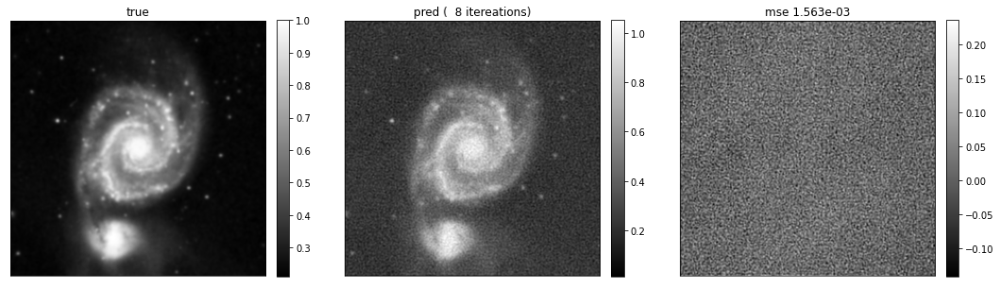

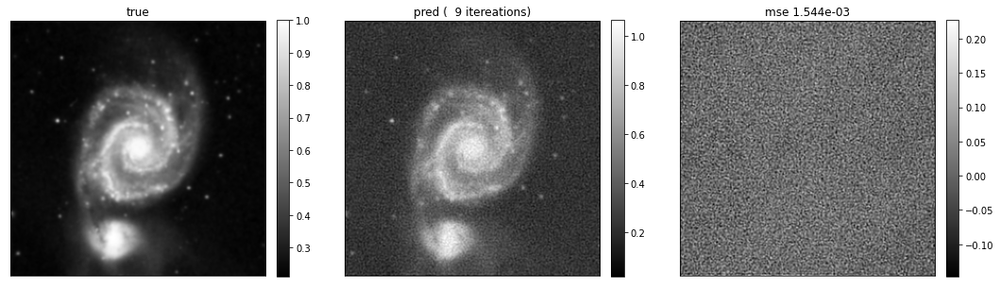

In [58]:
# gradient descent
x_ = tf.math.real(m_op.adj_op(y_dirty))
a = 1
for j in range(10):
    g = grad(x_, y_dirty)[0]
    x_ = x_ - a * g
    if j%1 ==0 :
        compare([x, x_.numpy().real[0], x-x_.numpy().real[0]], cmap='gray', titles=["true", f"pred ({j:>3} itereations)", f"mse {mse(x, x_.numpy().real[0]):.3e}"], colorbar=True, same_scale=False)
        plt.show()


# Gradient descent + denoiser

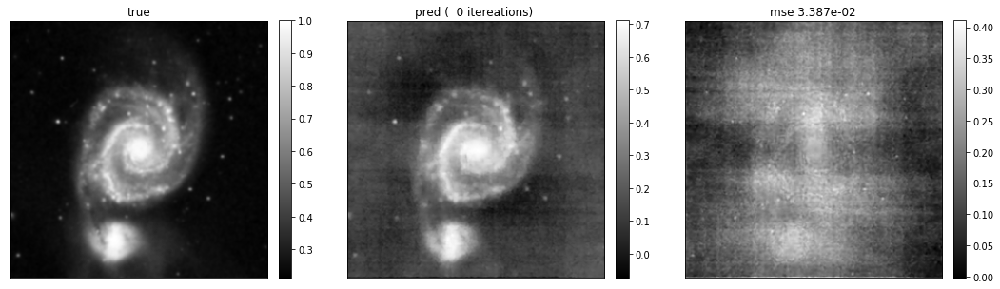

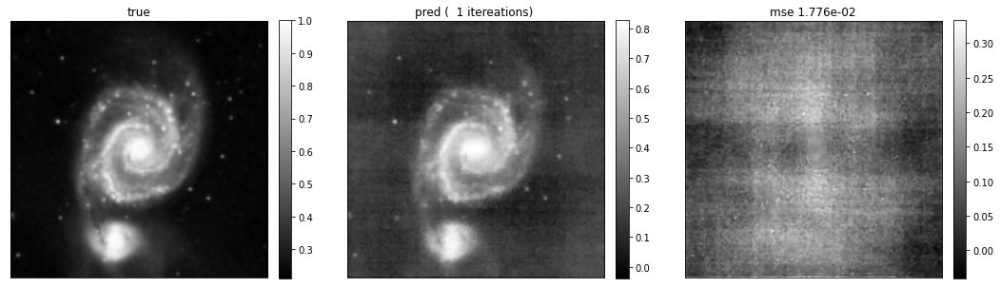

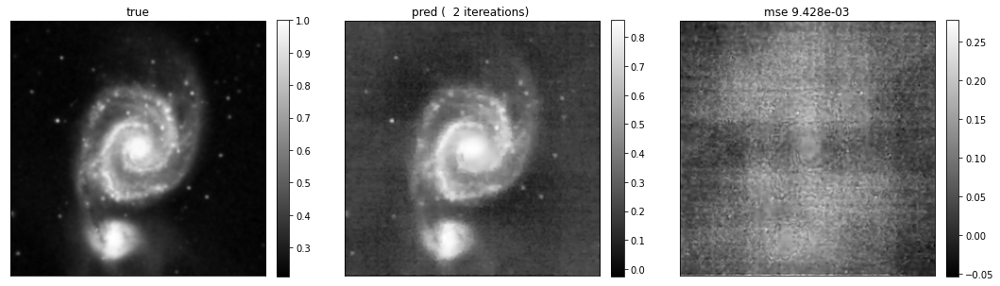

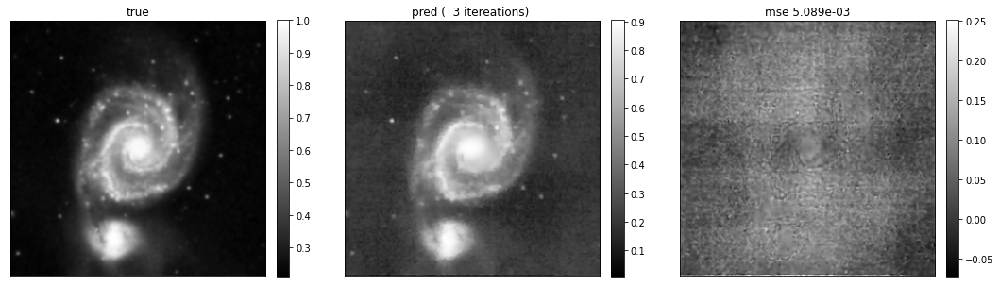

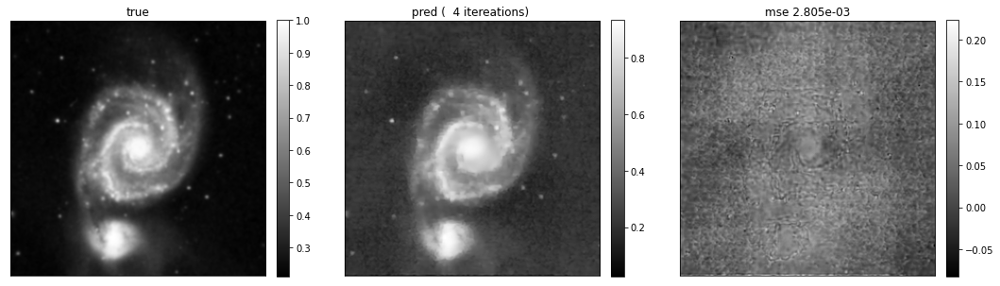

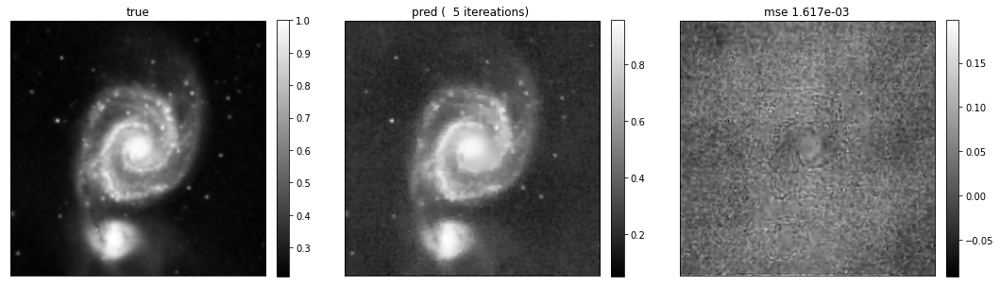

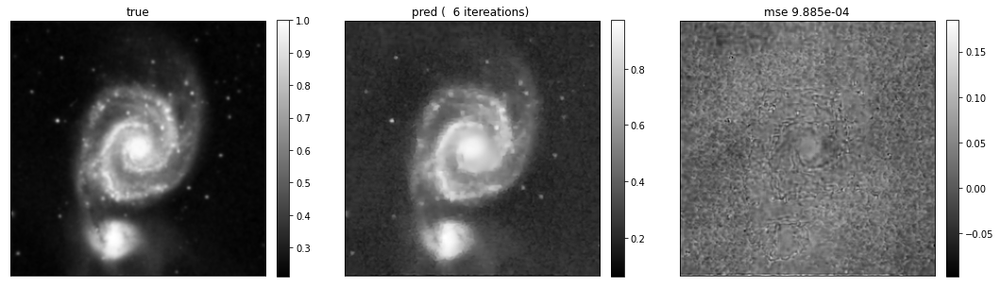

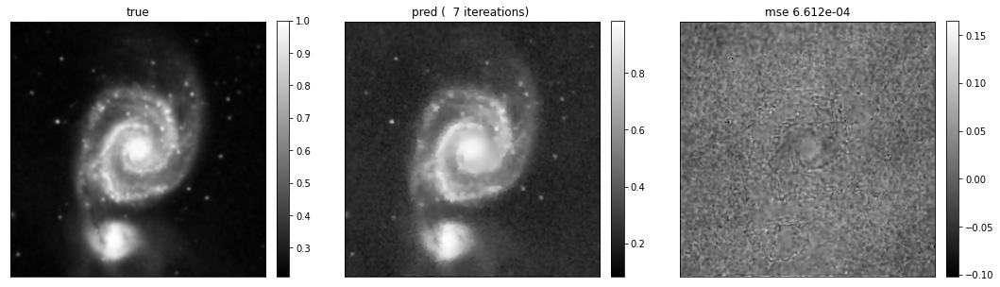

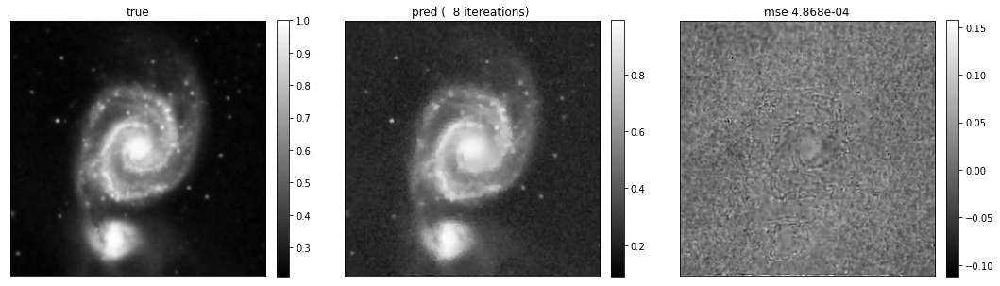

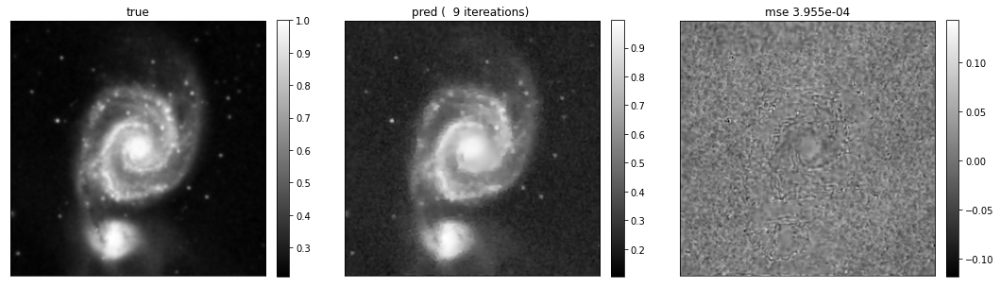

In [59]:

x_ = tf.math.real(m_op.adj_op(y_dirty))
a = 1
for j in range(10):
    g = grad(x_, y_dirty)[0]
    x_ = x_ - a * g
    
    # rescale to be within (0,1) for the denoiser
    
    x_ = x_.numpy()
    mintmp, maxtmp = x_.min(), x_.max()
    x_ = (x_ - mintmp)/(maxtmp - mintmp) 
    
    scale_range = 1.0 + sigma/2.0
    scale_shift = (1 - scale_range) / 2.0
    x_ = x_ * scale_range + scale_shift
    
    
    x_ = denoiser(x_)
    
    # undo scaling
    x_ = (x_ - scale_shift)/scale_range
    x_ = x_ * (maxtmp - mintmp) + mintmp
    
    if j % 1 == 0:
        compare([x, x_.numpy().real[0], x-x_.numpy().real[0]], cmap='gray', titles=["true", f"pred ({j:>3} itereations) ", f"mse {mse(x, x_.numpy().real[0]):.3e}"], colorbar=True, same_scale=False)
        plt.show()

## Now lets try with forward backward implementation

First import relevant packages

In [29]:
import optimusprimal.forward_backward as forward_backward
import optimusprimal.primal_dual as primal_dual
import optimusprimal.grad_operators as grad_operators
import optimusprimal.ai_operators as ai_operators
import optimusprimal.prox_operators as prox_operators

options = {"tol": 1e-4, "iter": 100, "update_iter": 10, "record_iters": False}

Define the data fidelity term -- in this case we use the keras layer implementation to match m_op

In [30]:
g = grad_operators.l2_norm_tf(sigma, y_dirty, m_op, Nd, (m_op.n_measurements,))

NameError: name 'y_dirty' is not defined

Define the learnt prior model operator (here a simple PnpDenoiser)

In [31]:
latest = tf.train.latest_checkpoint(f"./models/COCO/Identity/UNet_24dB")
denoiser.load_weights(latest)

h = ai_operators.PnpDenoiser(denoiser, sigma)

In [32]:
h = ai_operators.PnpDenoiser(denoiser, sigma)

Add a custom viewer so we can watch in realtime...

In [33]:
def custom_viewer(x_est, step):
    compare([x, x_est.numpy().real[0], x-x_est.numpy().real[0]], cmap='gray', titles=["true", f"pred ({step:>3} itereations) ", f"mse {mse(x, x_est.numpy().real[0]):.3e}"], colorbar=True, same_scale=True)
    plt.show()

... and run the algorithm ...

2022-03-14 13:20:03,178 - Optimus Primal - INFO - Running Base Forward Backward
2022-03-14 13:20:03,288 - Optimus Primal - INFO - [Forward Backward] 0 out of 100 iterations, tol = 0.527906


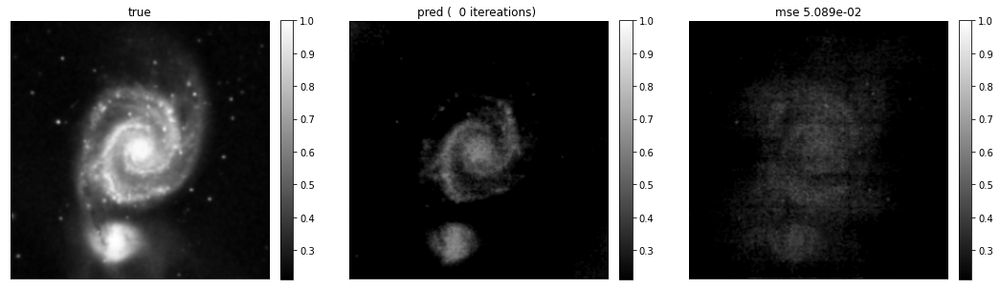

2022-03-14 13:20:04,515 - Optimus Primal - INFO - [Forward Backward] 10 out of 100 iterations, tol = 0.016016


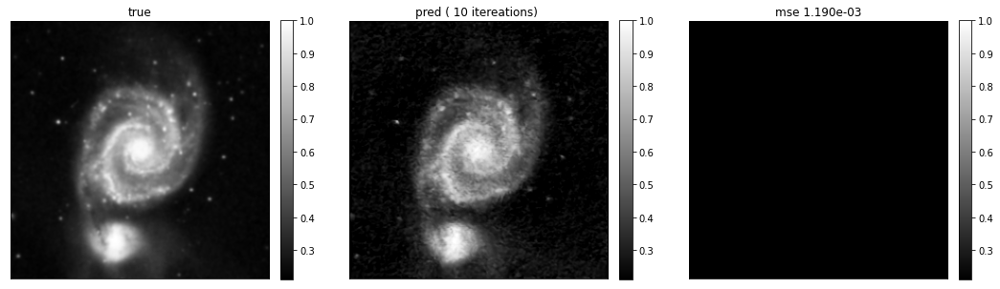

2022-03-14 13:20:05,571 - Optimus Primal - INFO - [Forward Backward] 20 out of 100 iterations, tol = 0.003357


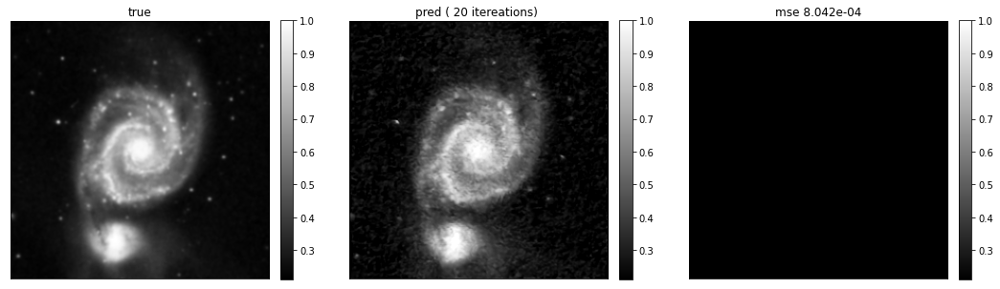

2022-03-14 13:20:06,632 - Optimus Primal - INFO - [Forward Backward] 30 out of 100 iterations, tol = 0.000868


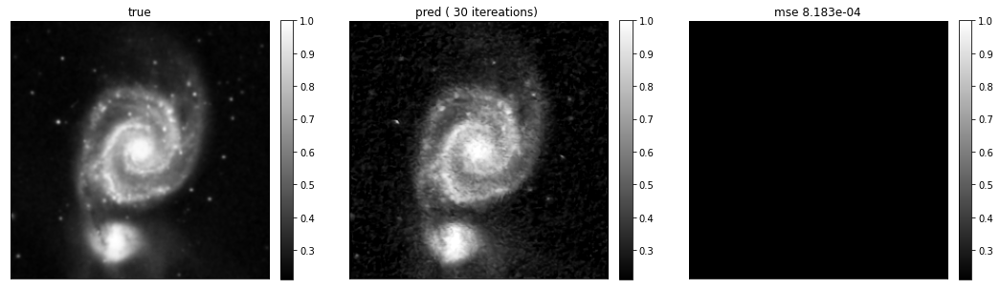

2022-03-14 13:20:07,735 - Optimus Primal - INFO - [Forward Backward] 40 out of 100 iterations, tol = 0.000182


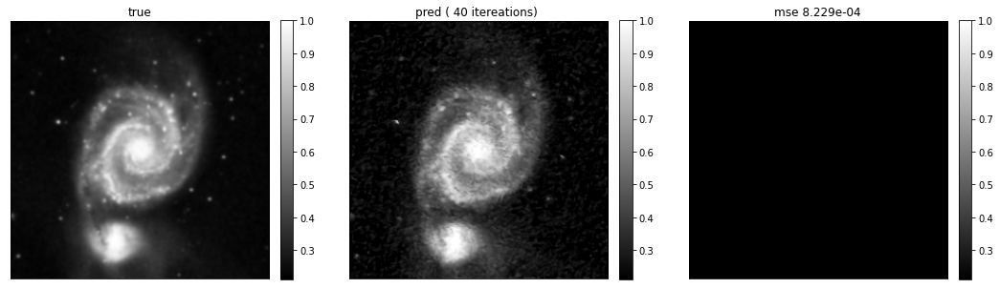

2022-03-14 13:20:08,822 - Optimus Primal - INFO - [Forward Backward] 50 out of 100 iterations, tol = 0.000121


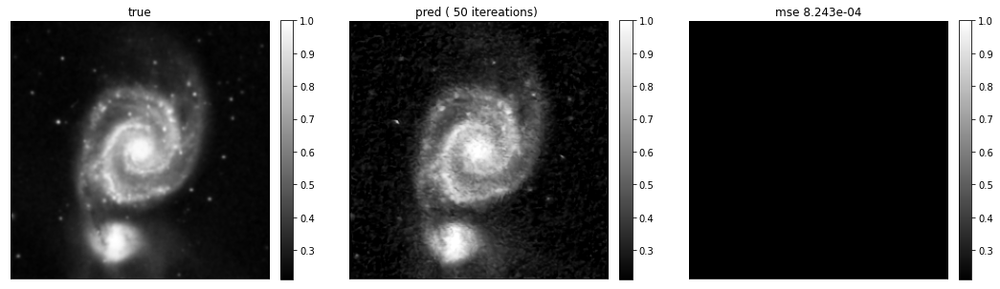

2022-03-14 13:20:09,921 - Optimus Primal - INFO - [Forward Backward] converged in 60 iterations


In [83]:
x_ = tf.math.real(m_op.adj_op(y_dirty))
best_estimate, diagnostics = forward_backward.FB(x_init=x_, options=options, g=g, h=h, alpha=1, viewer=custom_viewer)

In [40]:
from src.operators.dictionary import wavelet_basis

In [39]:
class l1_norm(prox_operators.ProximalOperator):
    """This class computes the proximity operator of the l2 ball.

                        f(x) = ||Psi x||_1 * gamma

    When the input 'x' is an array. gamma is a regularization term. Psi is a sparsity operator.
    """

    def __init__(self, gamma, Psi=None):
        """Initialises an l1-norm proximal operator class

        Args:

            gamma (double >= 0): Regularisation parameter
            Psi (Linear operator): Regularisation functional (typically wavelets)

        Raises:

            ValueError: Raised if regularisation parameter is not postitive semi-definite
        """

        if np.any(gamma <= 0):
            raise ValueError("'gamma' must be positive semi-definite")

        self.gamma = gamma
        self.beta = 1.0

        if Psi is None:
            self.Psi = linear_operators.identity()
        else:
            self.Psi = Psi

    def prox(self, x, tau):
        """Evaluates the l1-norm prox of x

        Args:

            x (np.ndarray): Array to evaluate proximal projection of
            tau (double): Custom weighting of l1-norm prox

        Returns:

            l1-norm prox of x
        """
        return np.maximum(0, np.abs(x) - self.gamma * tau) * np.exp(
            complex(0, 1) * np.angle(x)
        )

    def fun(self, x):
        """Evaluates loss of functional term of l1-norm regularisation

        Args:

            x (np.ndarray): Array to evaluate loss of

        Returns:

            l1-norm loss
        """
        return np.abs(self.gamma * x).sum()

    def dir_op(self, x):
        """Evaluates the forward regularisation operator

        Args:

            x (np.ndarray): Array to forward transform

        Returns:

            Forward regularisation operator applied to x
        """
        return self.Psi.dir_op(x[0])

    def adj_op(self, x):
        """Evaluates the forward adjoint regularisation operator

        Args:

            x (np.ndarray): Array to adjoint transform

        Returns:

            Forward adjoint regularisation operator applied to x
        """
        return self.Psi.adj_op(x)[None, :]


In [71]:
psi = wavelet_basis(x_[0].shape)

In [72]:
# a = PrimalDual_l1_constrained(m_op =m_op2, psi=psi, options={'tol': 1e-05, 'iter': 100, 'update_iter': 10, 'record_iters': False, 'positivity': True, 'real': True})

In [73]:
step = 5e-3
h2 = l1_norm(step, psi)

In [74]:
options = {"tol": 1e-5, "iter": 200, "update_iter": 99, "record_iters": False}

2022-03-14 14:06:50,276 - Optimus Primal - INFO - Running Base Forward Backward
2022-03-14 14:06:50,421 - Optimus Primal - INFO - [Forward Backward] 0 out of 100 iterations, tol = 0.242309


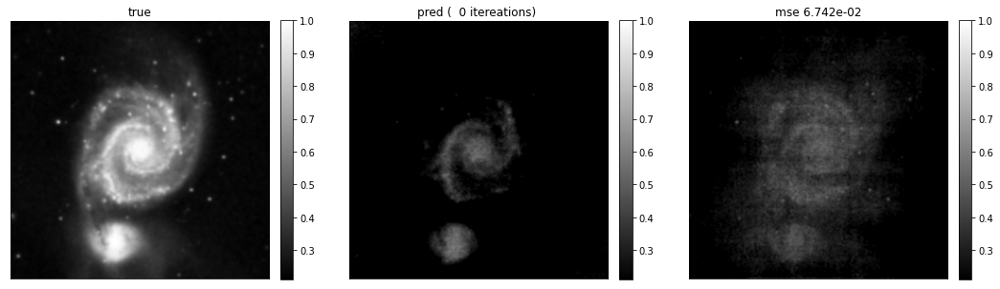

2022-03-14 14:06:52,025 - Optimus Primal - INFO - [Forward Backward] 10 out of 100 iterations, tol = 0.031129


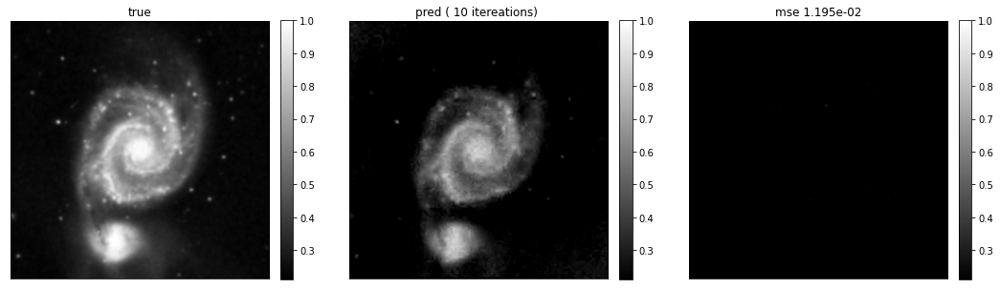

2022-03-14 14:06:53,478 - Optimus Primal - INFO - [Forward Backward] 20 out of 100 iterations, tol = 0.009170


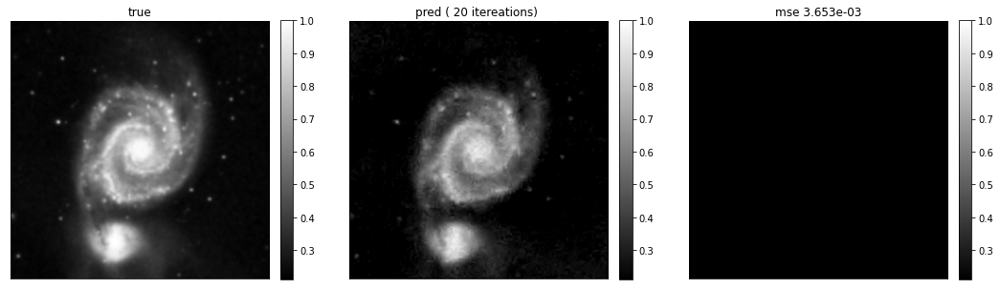

2022-03-14 14:06:54,978 - Optimus Primal - INFO - [Forward Backward] 30 out of 100 iterations, tol = 0.003122


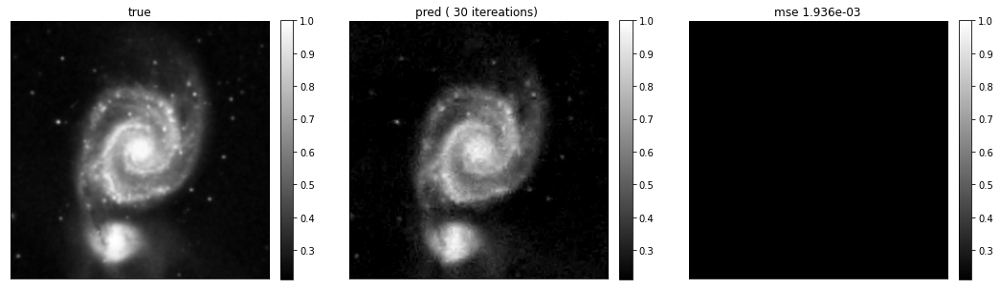

KeyboardInterrupt: 

In [91]:
x_ = tf.math.real(m_op.adj_op(y_dirty))
best_estimate2, diagnostics2 = forward_backward.FB(x_init=x_, alpha=0.5, options=options, g=g, h=h2, viewer=custom_viewer)

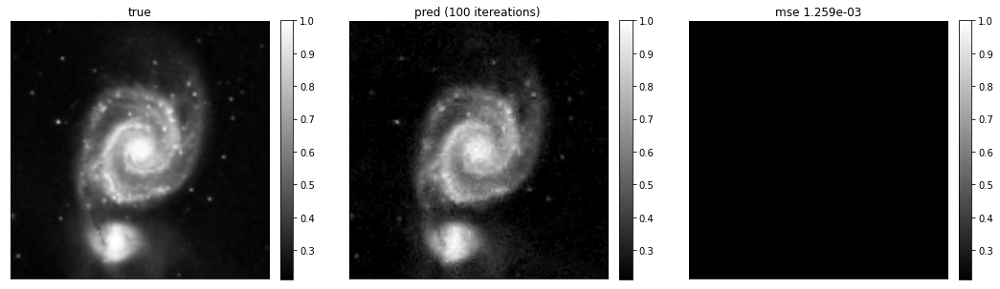

In [76]:
custom_viewer(best_estimate2, 100)

In [77]:
from src.solvers import FB_unconstrained

In [94]:
options = {"tol": 1e-4, "iter": 100, "update_iter": 10, "record_iters": False, "real": False, "positivity": False}
solver = FB_unconstrained(m_op, h2, options=options)

{'tol': 0.0001, 'iter': 100, 'update_iter': 10, 'record_iters': False, 'real': False, 'positivity': False}


In [92]:
solver = FB_unconstrained(m_op, h2, options=options)

{'tol': 0.0001, 'iter': 100, 'update_iter': 10, 'record_iters': False, 'real': False, 'positivity': False}


In [93]:
im, diag = solver.solve(y_dirty, m_op, sigma)

2022-03-14 14:07:01,477 - Optimus Primal - INFO - Running Base Forward Backward
2022-03-14 14:07:01,660 - Optimus Primal - INFO - [Forward Backward] 0 out of 100 iterations, tol = 0.165917
2022-03-14 14:07:03,020 - Optimus Primal - INFO - [Forward Backward] 10 out of 100 iterations, tol = 0.029531
2022-03-14 14:07:04,220 - Optimus Primal - INFO - [Forward Backward] 20 out of 100 iterations, tol = 0.011066
2022-03-14 14:07:05,415 - Optimus Primal - INFO - [Forward Backward] 30 out of 100 iterations, tol = 0.005630
2022-03-14 14:07:06,606 - Optimus Primal - INFO - [Forward Backward] 40 out of 100 iterations, tol = 0.003671


KeyboardInterrupt: 

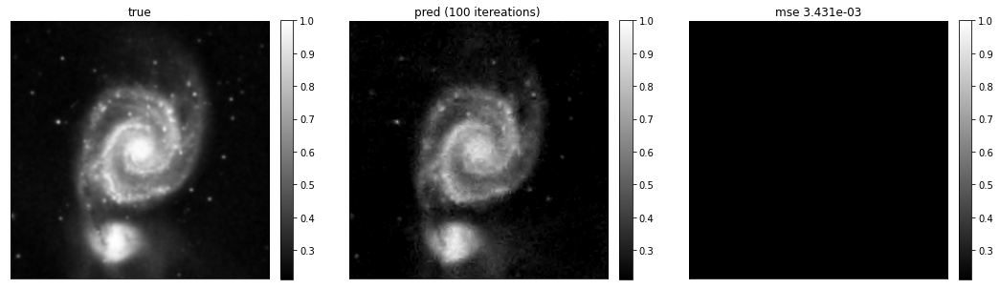

In [56]:
custom_viewer(tf.convert_to_tensor(im), 100)

In [95]:
solver2 = FB_unconstrained(m_op, h, options=options)

{'tol': 0.0001, 'iter': 100, 'update_iter': 10, 'record_iters': False, 'real': False, 'positivity': False}


In [96]:
im2, diag = solver2.solve(y_dirty, m_op, sigma)

2022-03-14 14:07:13,905 - Optimus Primal - INFO - Running Base Forward Backward
2022-03-14 14:07:14,016 - Optimus Primal - INFO - [Forward Backward] 0 out of 100 iterations, tol = 1.209743
2022-03-14 14:07:14,887 - Optimus Primal - INFO - [Forward Backward] 10 out of 100 iterations, tol = 0.538667
2022-03-14 14:07:15,586 - Optimus Primal - INFO - [Forward Backward] 20 out of 100 iterations, tol = 0.390991
2022-03-14 14:07:16,280 - Optimus Primal - INFO - [Forward Backward] 30 out of 100 iterations, tol = 1.081375
2022-03-14 14:07:16,976 - Optimus Primal - INFO - [Forward Backward] 40 out of 100 iterations, tol = 0.267228
2022-03-14 14:07:17,672 - Optimus Primal - INFO - [Forward Backward] 50 out of 100 iterations, tol = 0.425120
2022-03-14 14:07:18,366 - Optimus Primal - INFO - [Forward Backward] 60 out of 100 iterations, tol = 0.497631
2022-03-14 14:07:19,060 - Optimus Primal - INFO - [Forward Backward] 70 out of 100 iterations, tol = 0.471632
2022-03-14 14:07:19,754 - Optimus Primal 

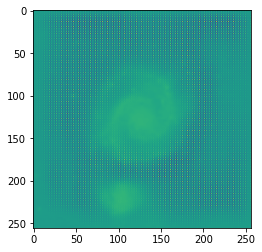

In [99]:
plt.imshow(denoiser(im)[0])

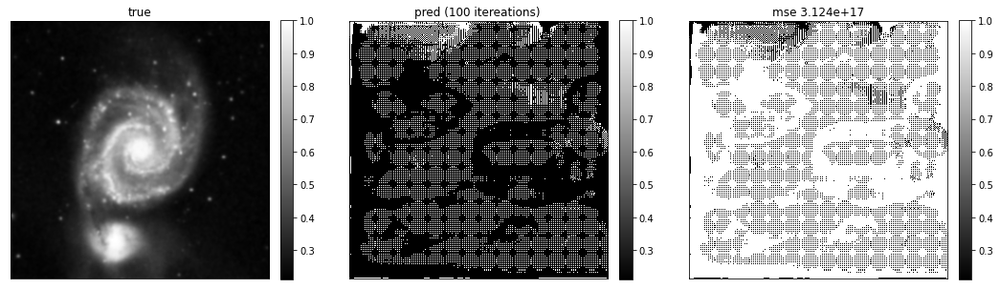

In [97]:
custom_viewer(tf.convert_to_tensor(im2), 100)

In [60]:
res, diag = a.solve(y_dirty.numpy(), m_op2, sigma)

AttributeError: 'int' object has no attribute 'solve'

In [ ]:
compare([x, res, x-res], cmap='gray', titles=["true", f"pred ({100:>3} itereations) ", f"mse {mse(x, res):.3e}"], colorbar=True, same_scale=False)


In [ ]:
compare([x, best_estimate[0].numpy().real, x-best_estimate[0].numpy().real], cmap='gray', titles=["true", f"pred ({100:>3} itereations) ", f"mse {mse(x, best_estimate[0].numpy().real):.3e}"], colorbar=True, same_scale=False)


In [ ]:
    def __init__(self, m_op, psi, beta=1e-2, 
        options={ 'tol': 1e-5, 'iter': 5000, 'update_iter': 50, 
        'record_iters': False, 'positivity': True, 'real': True}):
        super().__init__(m_op, options=options)
        self.psi = psi
        # self.noise_val = noise_val
        self.beta = beta
        print(self.options)

    def solve(self, y, m_op, noise_val):
        x0 = m_op.adj_op(y)

        size = len(np.ravel(y))
        epsilon = np.sqrt(size + 2 * np.sqrt(size)) * noise_val

        nu, sol = linear_operators.power_method(m_op, x0)

        p = prox_operators.l2_ball(epsilon, y, m_op)
        p.beta = nu
        
        step = np.max(np.real(self.psi.dir_op(x0))) * self.beta
        h = prox_operators.l1_norm(step, self.psi)
        f = None
        if self.options['real'] == True:
            if self.options["positivity"] == True:
                f = prox_operators.positive_prox()
            else:
                f = prox_operators.real_prox()
        r = None
        return primal_dual.FBPD(x0, self.options, None, f, h, p, r)

In [72]:
options={ 'tol': 1e-5, 'iter': 100, 'update_iter': 10, 
        'record_iters': False, 'positivity': False, 'real': False}

In [75]:
g.beta

926.92941879458

In [43]:
x_ = tf.math.real(m_op.adj_op(y_dirty))

In [44]:
nu, sol = linear_operators.power_method(m_op, x_)


2022-03-17 14:18:12,264 - Optimus Primal - INFO - Starting Power method
2022-03-17 14:18:12,381 - Optimus Primal - INFO - [Power Method] iter = 1, tol = 0.0
2022-03-17 14:18:12,825 - Optimus Primal - INFO - [Power Method] iter = 11, tol = 0.0
2022-03-17 14:18:13,237 - Optimus Primal - INFO - [Power Method] iter = 21, tol = 0.0
2022-03-17 14:18:13,479 - Optimus Primal - INFO - [Power Method] Converged with norm= 2.3531387, iter = 27, tol = 0.000849981


In [85]:
sigma

0.03284555971622467

0.04641929166166894

In [45]:
size = m_op.n_measurements
epsilon = np.sqrt(size + 2 * np.sqrt(size)) * sigma

p = prox_operators.l2_ball(epsilon, y_dirty, m_op)
p.beta = nu

In [57]:
latest = tf.train.latest_checkpoint(f"./models/COCO/Identity/UNet_24dB")
denoiser.load_weights(latest);

h = ai_operators.PnpDenoiser(denoiser, sigma)

2022-03-17 14:20:33,032 - Optimus Primal - INFO - Running Forward Backward Primal Dual
2022-03-17 14:20:33,118 - Optimus Primal - INFO - [Primal Dual] 0 out of 100 iterations, tol = 0.000000


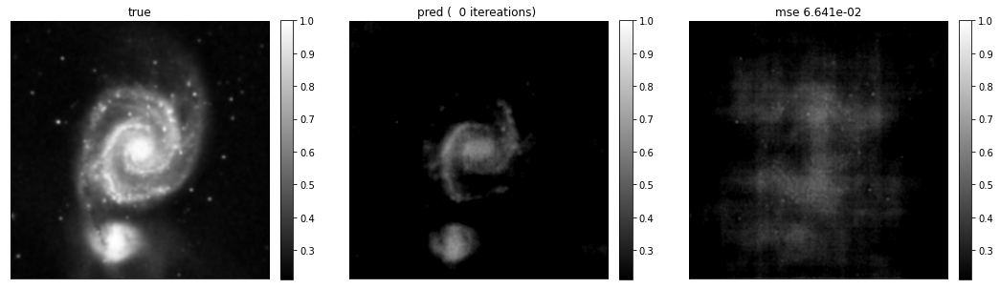

2022-03-17 14:20:34,333 - Optimus Primal - INFO - [Primal Dual] 10 out of 100 iterations, tol = 0.107543


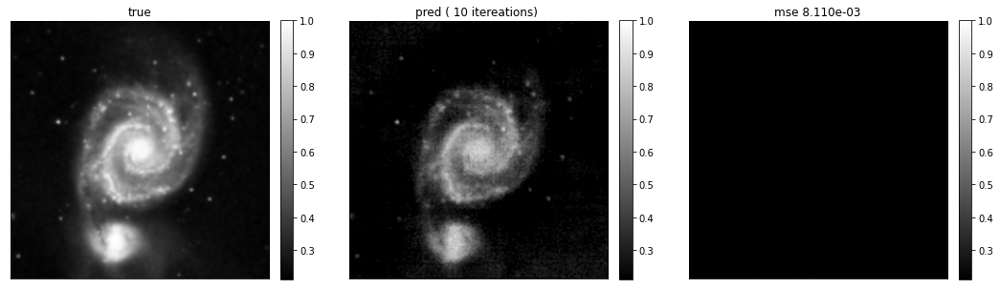

2022-03-17 14:20:35,432 - Optimus Primal - INFO - [Primal Dual] 20 out of 100 iterations, tol = 0.045058


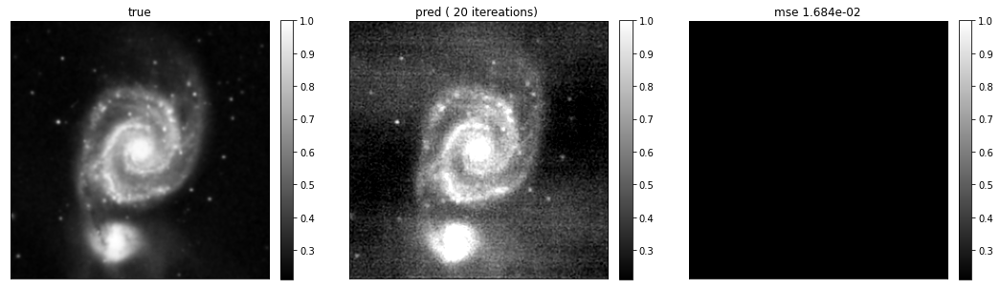

2022-03-17 14:20:36,538 - Optimus Primal - INFO - [Primal Dual] 30 out of 100 iterations, tol = 0.031393


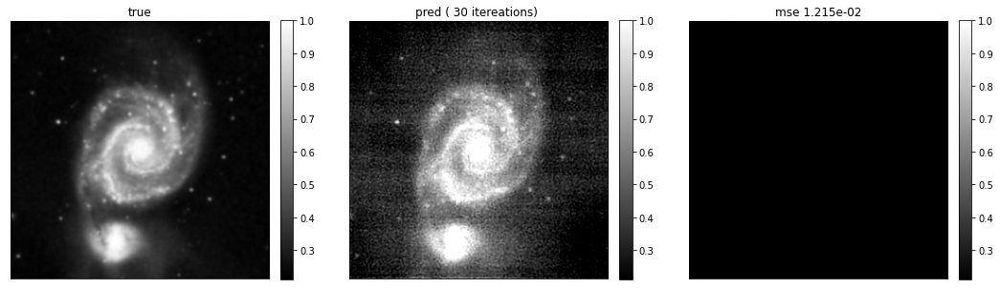

2022-03-17 14:20:37,644 - Optimus Primal - INFO - [Primal Dual] 40 out of 100 iterations, tol = 0.040518


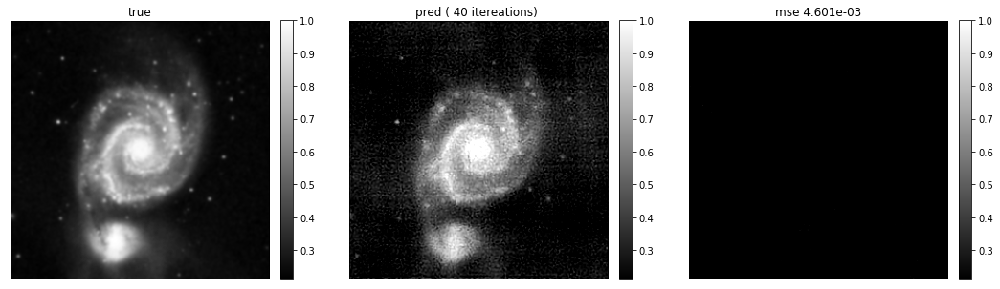

2022-03-17 14:20:38,747 - Optimus Primal - INFO - [Primal Dual] 50 out of 100 iterations, tol = 0.035971


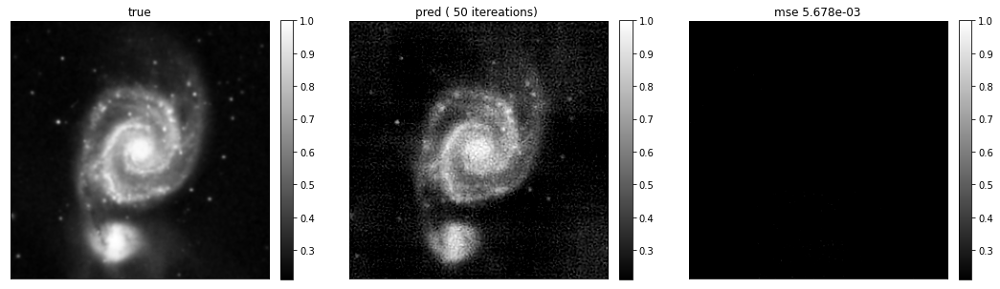

2022-03-17 14:20:40,044 - Optimus Primal - INFO - [Primal Dual] 60 out of 100 iterations, tol = 0.020720


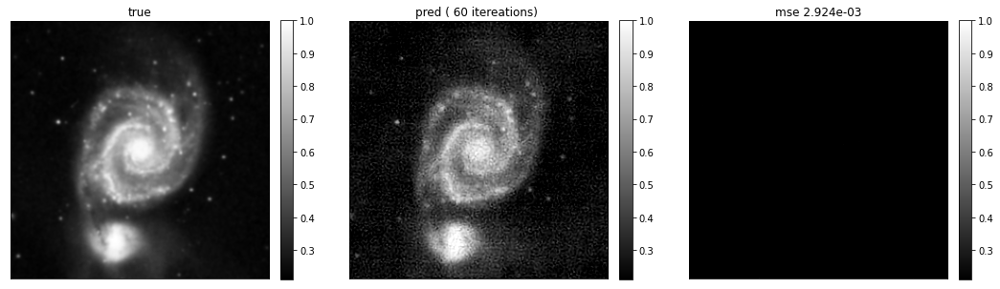

2022-03-17 14:20:41,144 - Optimus Primal - INFO - [Primal Dual] 70 out of 100 iterations, tol = 0.016243


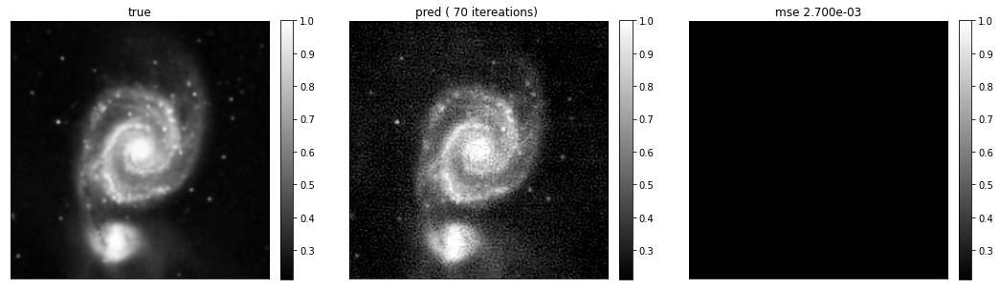

2022-03-17 14:20:42,248 - Optimus Primal - INFO - [Primal Dual] 80 out of 100 iterations, tol = 0.021189


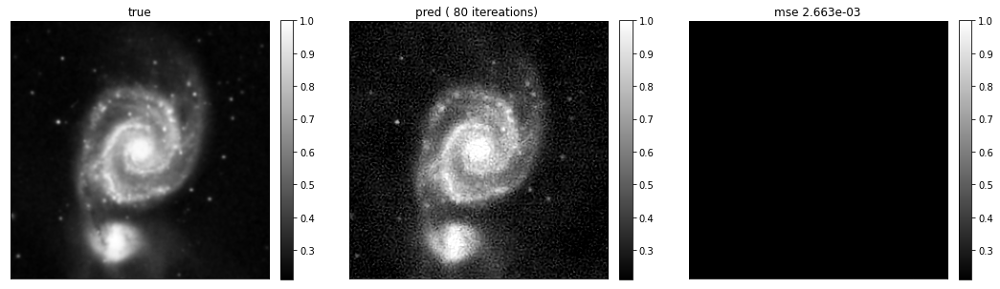

2022-03-17 14:20:43,348 - Optimus Primal - INFO - [Primal Dual] 90 out of 100 iterations, tol = 0.012572


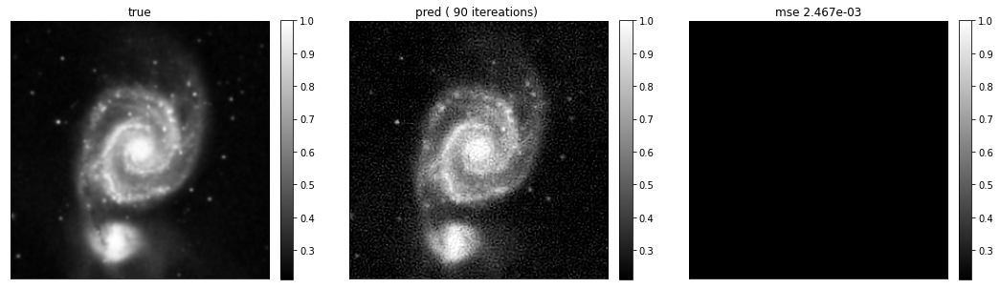

In [58]:
x_ = tf.math.real(m_op.adj_op(y_dirty))
h.beta = 10
best_estimate, diagnostics = primal_dual.FBPD(x_init=x_, options=options, p=p, h=h, viewer=custom_viewer, Theta=0)

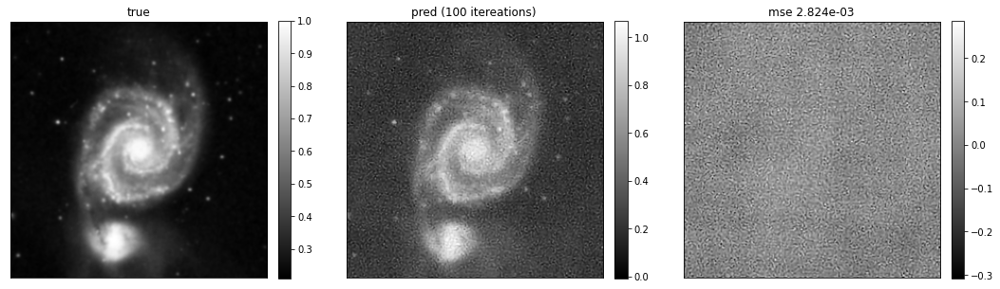

In [59]:
compare([x, best_estimate[0].numpy().real, x-best_estimate[0].numpy().real], cmap='gray', titles=["true", f"pred ({100:>3} itereations) ", f"mse {mse(x, best_estimate[0].numpy().real):.3e}"], colorbar=True, same_scale=False)
